In [1]:
from typing import List

import numpy as np
import pandas as pd
from experiments.common import run_increasing_size_neighborhoods_experiments
from experiments.data.synthetic_normal_benchmarks import (
    benchmark_curve_1,
    benchmark_curve_2,
    benchmark_curve_3,
    benchmark_curve_4,
    benchmark_curve_5,
)

%load_ext autoreload
%autoreload 2

# Experiments in dense heteroscedastic Gaussian settings with increasing window size
The following are plots and metrics for a number of experimental settings with dense heteroscedastic curves and additive i.i.d. Gaussian noise comparing the proposed Robust Local Polynomial Regression with Similarity Kernels method with LOWESS, robust LOWESS, kernel regression, local quadratic and RBF network regression. The plots are interactive and allows to hide and show different elements by clicking or double-clicking as well as to zoom in on areas of interest.

In [4]:
extreme_noise_ratio: float = 0.95
high_noise_ratio: float = 0.65
medium_noise_ratio: float = 0.35
mild_noise_ratio: float = 0.15
hetero: bool = True
num_points: int = 150

size_neighborhoods: List[int] = [5, 7, 9, 11, 13, 15] + np.linspace(
    start=20, stop=num_points, num=10, endpoint=True
).astype(int).tolist()


def bw1_f(data: np.ndarray) -> List[float]:
    return [float(1 / np.clip(a=0.1 * data.shape[0], a_min=2.0, a_max=27.0))] * data.shape[1]


methods: List[str] = [
    "rsklpr",
    "rsklpr_quad",
    "lowess",
    "robust_lowess",
    "kernel_reg_ll",
    "kernel_reg_lc",
    "local_quad",
    "rbfnet",
]

## Curve 1

### Mild noise

/home/yaniv/.cache/pypoetry/virtualenvs/rsklpr-Zq1jVLl1-py3.12/lib/python3.12/site-packages/chart_studio/tools.py:290: SyntaxWarning:

"is" with 'str' literal. Did you mean "=="?



Best performing method is rsklpr_quad for size_neighborhood w_34


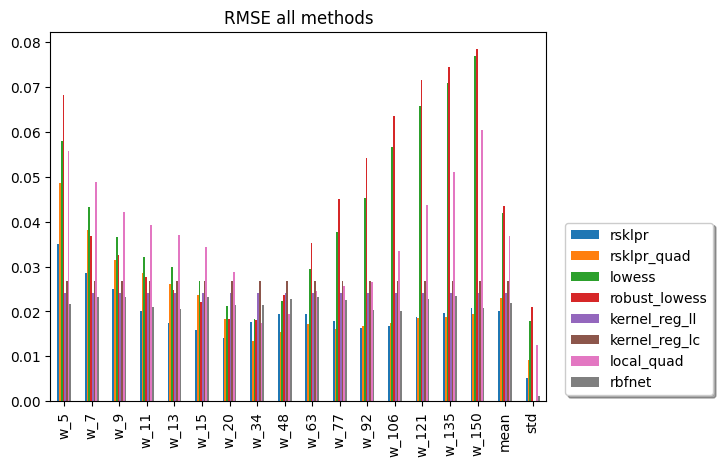

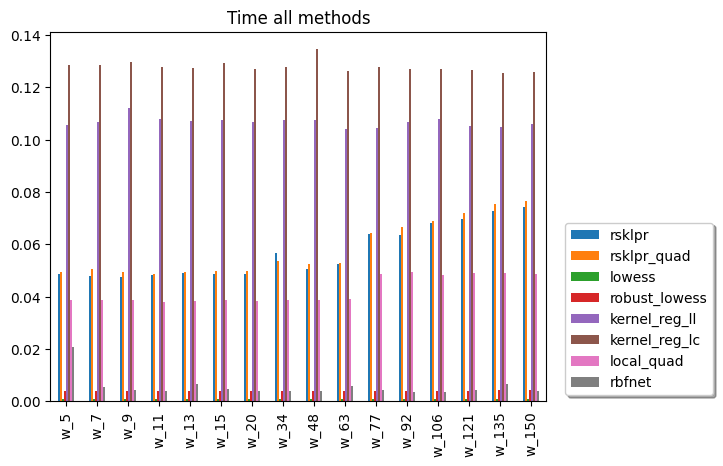

In [6]:
best_for_window: pd.DataFrame
worst_for_window: pd.DataFrame

best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [7]:
best_for_window

,method,rmse
w_5,rbfnet,0.021756
w_7,rbfnet,0.023160
w_9,rbfnet,0.023239
w_11,rsklpr,0.020153
w_13,rsklpr,0.017492
w_15,rsklpr,0.015813
w_20,rsklpr,0.014015
w_34,rsklpr_quad,0.013384
w_48,rsklpr_quad,0.015454
w_63,rsklpr_quad,0.017234


In [8]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.068109
w_7,local_quad,0.048830
w_9,local_quad,0.042195
w_11,local_quad,0.039196
w_13,local_quad,0.036988
w_15,local_quad,0.034255
w_20,local_quad,0.028825
w_34,kernel_reg_lc,0.026691
w_48,kernel_reg_lc,0.026691
w_63,robust_lowess,0.035165


### Medium noise

Best performing method is rsklpr for size_neighborhood w_34


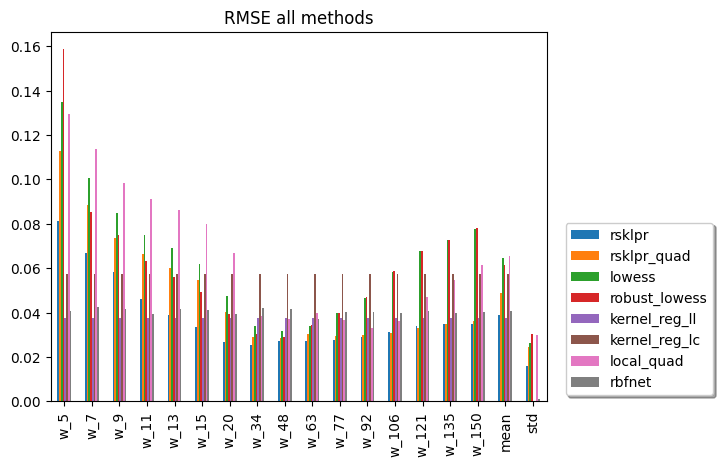

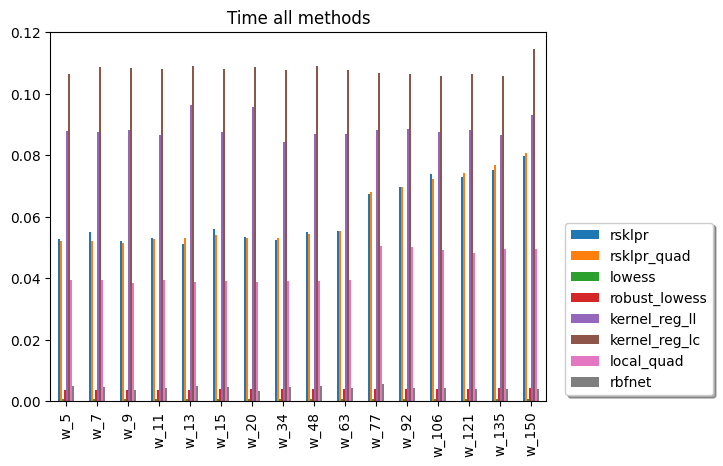

In [9]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    kr="joint",
    methods=methods,
)

In [10]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.037550
w_7,kernel_reg_ll,0.037550
w_9,kernel_reg_ll,0.037550
w_11,kernel_reg_ll,0.037550
w_13,kernel_reg_ll,0.037550
w_15,rsklpr,0.033386
w_20,rsklpr,0.026838
w_34,rsklpr,0.025590
w_48,rsklpr,0.027088
w_63,rsklpr,0.027318


In [11]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.158581
w_7,local_quad,0.113764
w_9,local_quad,0.098289
w_11,local_quad,0.091360
w_13,local_quad,0.086179
w_15,local_quad,0.079844
w_20,local_quad,0.066928
w_34,kernel_reg_lc,0.057474
w_48,kernel_reg_lc,0.057474
w_63,kernel_reg_lc,0.057474


### High noise

Best performing method is rsklpr for size_neighborhood w_63


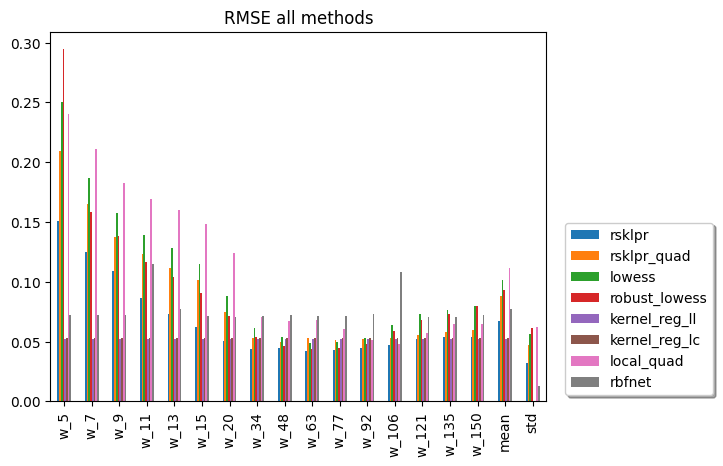

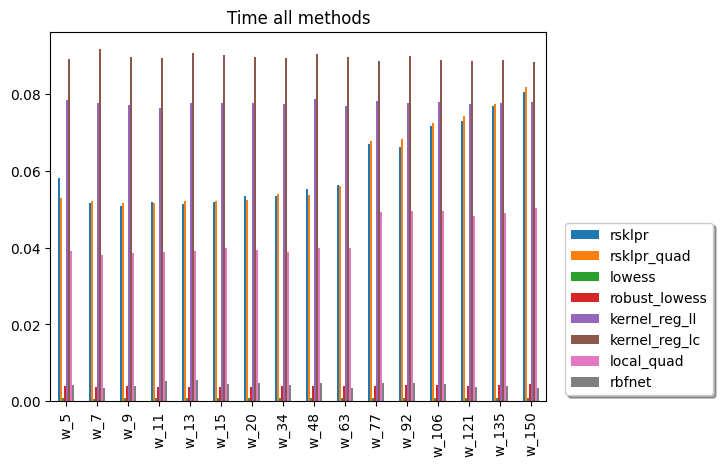

In [12]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    kr="joint",
    methods=methods,
)

In [13]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.052573
w_7,kernel_reg_ll,0.052573
w_9,kernel_reg_ll,0.052573
w_11,kernel_reg_ll,0.052573
w_13,kernel_reg_ll,0.052573
w_15,kernel_reg_ll,0.052573
w_20,rsklpr,0.050546
w_34,rsklpr,0.043739
w_48,rsklpr,0.044499
w_63,rsklpr,0.042265


In [14]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.294319
w_7,local_quad,0.211172
w_9,local_quad,0.182436
w_11,local_quad,0.169619
w_13,local_quad,0.159990
w_15,local_quad,0.148280
w_20,local_quad,0.124242
w_34,rbfnet,0.071683
w_48,rbfnet,0.072158
w_63,rbfnet,0.071591


### Extreme noise

Best performing method is robust_lowess for size_neighborhood w_92


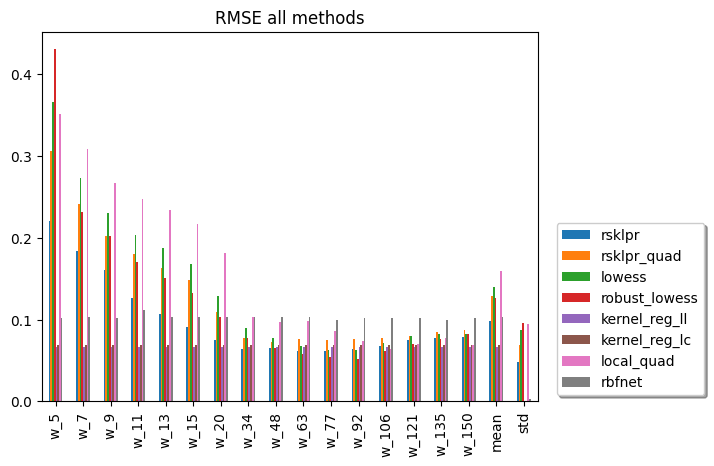

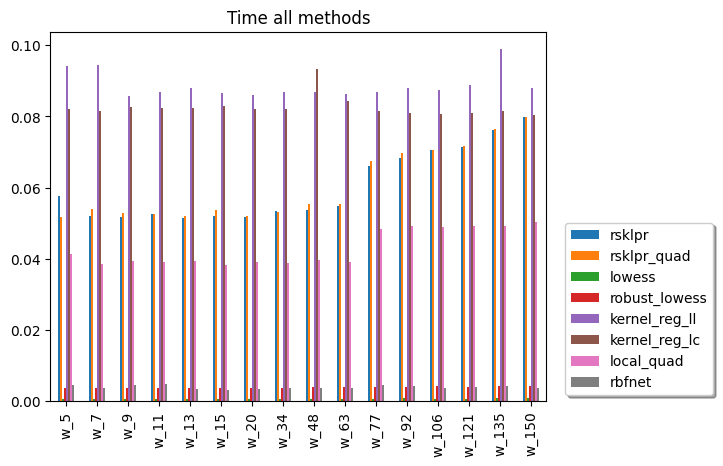

In [15]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_1,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="normal_reference",
    kr="joint",
    methods=methods,
)

In [16]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.066500
w_7,kernel_reg_ll,0.066500
w_9,kernel_reg_ll,0.066500
w_11,kernel_reg_ll,0.066500
w_13,kernel_reg_ll,0.066500
w_15,kernel_reg_ll,0.066500
w_20,kernel_reg_ll,0.066500
w_34,rsklpr,0.063515
w_48,rsklpr,0.064816
w_63,robust_lowess,0.057920


In [17]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.430046
w_7,local_quad,0.308581
w_9,local_quad,0.266584
w_11,local_quad,0.247881
w_13,local_quad,0.233805
w_15,local_quad,0.216725
w_20,local_quad,0.181587
w_34,local_quad,0.103171
w_48,rbfnet,0.103466
w_63,rbfnet,0.103152


## Curve 2

### Mild noise

Best performing method is local_quad for size_neighborhood w_34


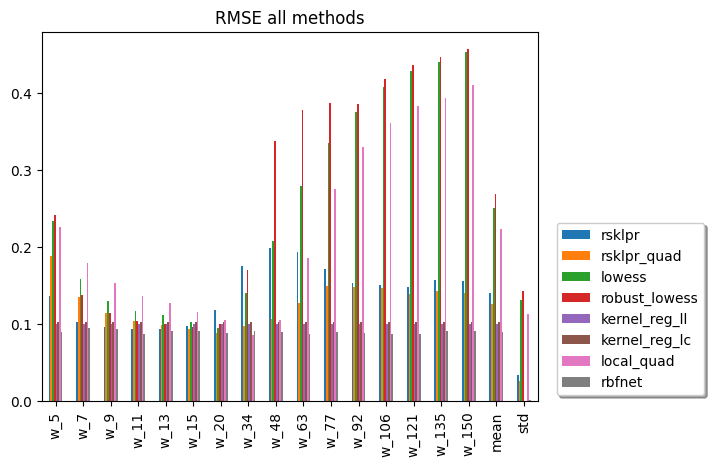

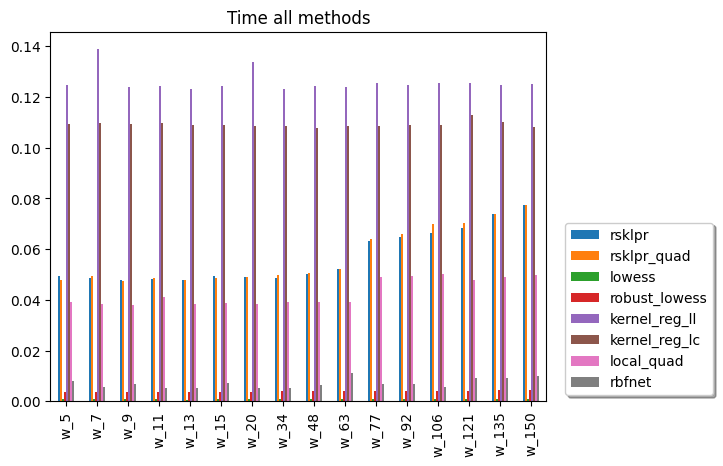

In [18]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [19]:
best_for_window

,method,rmse
w_5,rbfnet,0.090402
w_7,rbfnet,0.094724
w_9,rbfnet,0.093979
w_11,rbfnet,0.087400
w_13,rbfnet,0.091893
w_15,rbfnet,0.090751
w_20,rbfnet,0.088486
w_34,local_quad,0.086692
w_48,rbfnet,0.090200
w_63,rbfnet,0.087956


In [20]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.241249
w_7,local_quad,0.179521
w_9,local_quad,0.153572
w_11,local_quad,0.137246
w_13,local_quad,0.127038
w_15,local_quad,0.115644
w_20,rsklpr,0.118509
w_34,rsklpr,0.175107
w_48,robust_lowess,0.337960
w_63,robust_lowess,0.378363


### Medium noise

Best performing method is rsklpr_quad for size_neighborhood w_34


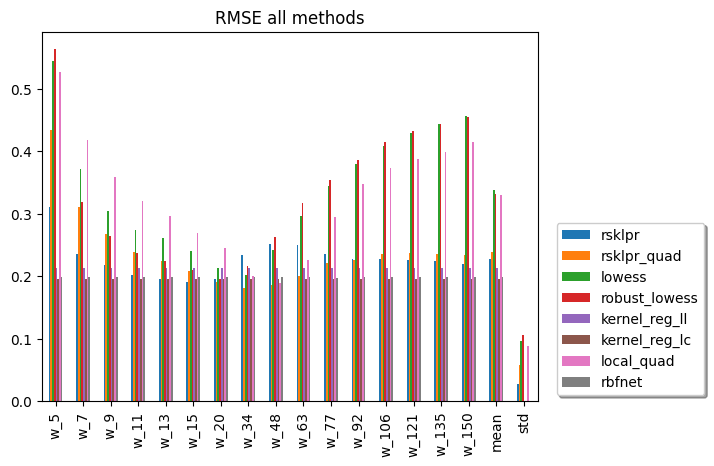

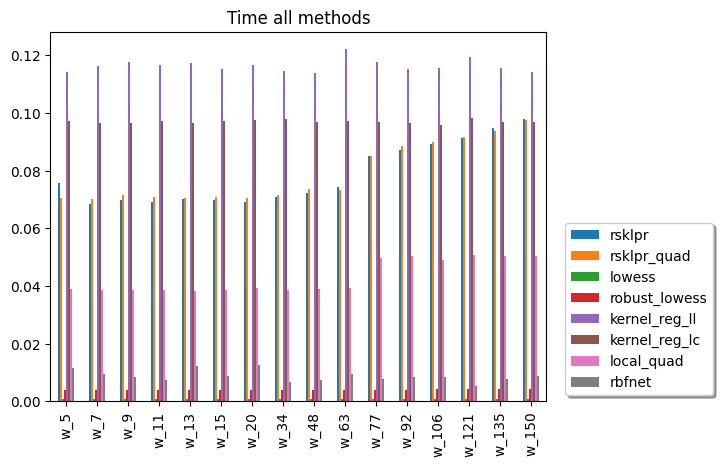

In [21]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="cv_ls_global",
    kr="joint",
    methods=methods,
)

In [22]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.195913
w_7,kernel_reg_lc,0.195913
w_9,kernel_reg_lc,0.195913
w_11,kernel_reg_lc,0.195913
w_13,rsklpr,0.195425
w_15,rsklpr,0.191284
w_20,rsklpr_quad,0.191681
w_34,rsklpr_quad,0.180886
w_48,rsklpr_quad,0.185493
w_63,kernel_reg_lc,0.195913


In [23]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.562987
w_7,local_quad,0.418768
w_9,local_quad,0.358290
w_11,local_quad,0.320282
w_13,local_quad,0.296632
w_15,local_quad,0.269989
w_20,local_quad,0.245433
w_34,rsklpr,0.233588
w_48,robust_lowess,0.263458
w_63,robust_lowess,0.317403


### High noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


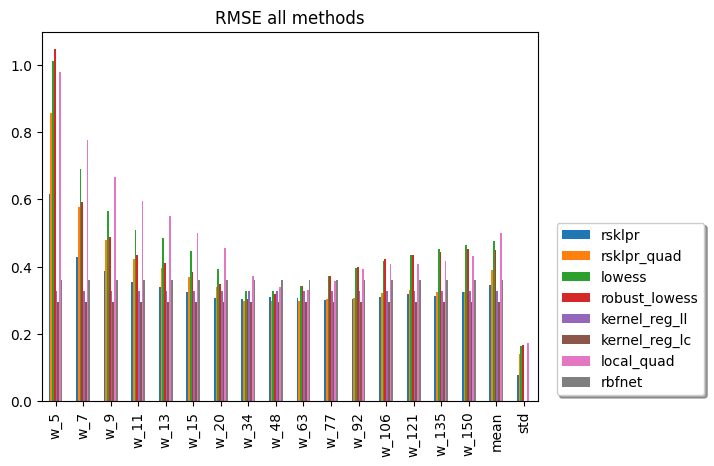

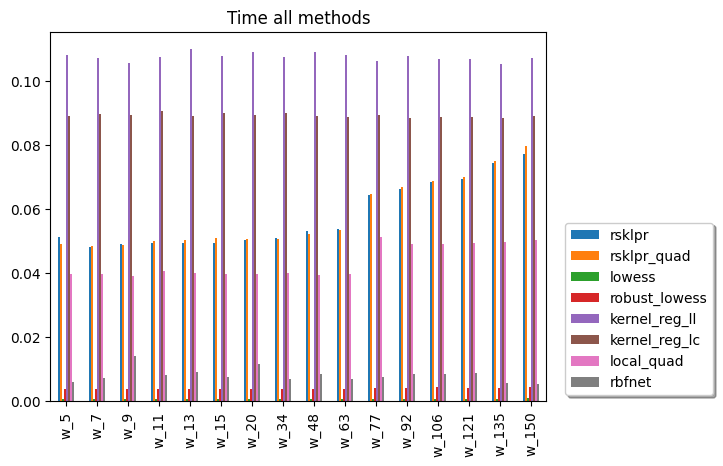

In [24]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [25]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.294714
w_7,kernel_reg_lc,0.294714
w_9,kernel_reg_lc,0.294714
w_11,kernel_reg_lc,0.294714
w_13,kernel_reg_lc,0.294714
w_15,kernel_reg_lc,0.294714
w_20,kernel_reg_lc,0.294714
w_34,kernel_reg_lc,0.294714
w_48,kernel_reg_lc,0.294714
w_63,kernel_reg_lc,0.294714


In [26]:
worst_for_window

,method,rmse
w_5,robust_lowess,1.045650
w_7,local_quad,0.777638
w_9,local_quad,0.665371
w_11,local_quad,0.594856
w_13,local_quad,0.551061
w_15,local_quad,0.501577
w_20,local_quad,0.456033
w_34,local_quad,0.373969
w_48,rbfnet,0.361857
w_63,rbfnet,0.361466


### Extreme noise

Best performing method is rsklpr for size_neighborhood w_48


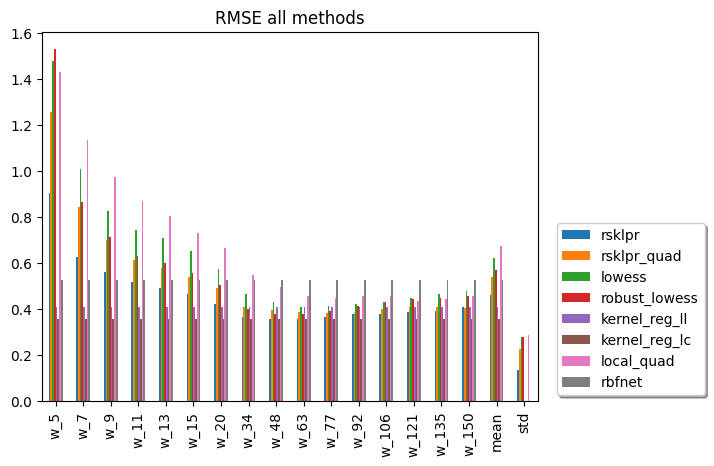

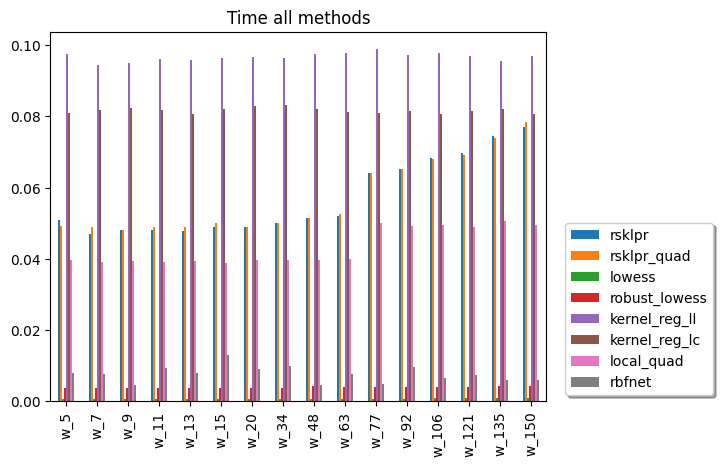

In [27]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_2,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [28]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.359030
w_7,kernel_reg_lc,0.359030
w_9,kernel_reg_lc,0.359030
w_11,kernel_reg_lc,0.359030
w_13,kernel_reg_lc,0.359030
w_15,kernel_reg_lc,0.359030
w_20,kernel_reg_lc,0.359030
w_34,kernel_reg_lc,0.359030
w_48,rsklpr,0.356598
w_63,rsklpr,0.357726


In [29]:
worst_for_window

,method,rmse
w_5,robust_lowess,1.528315
w_7,local_quad,1.136507
w_9,local_quad,0.972452
w_11,local_quad,0.869435
w_13,local_quad,0.805498
w_15,local_quad,0.733178
w_20,local_quad,0.666674
w_34,local_quad,0.547698
w_48,rbfnet,0.526400
w_63,rbfnet,0.526284


## Curve 3

### Mild noise

Best performing method is robust_lowess for size_neighborhood w_15


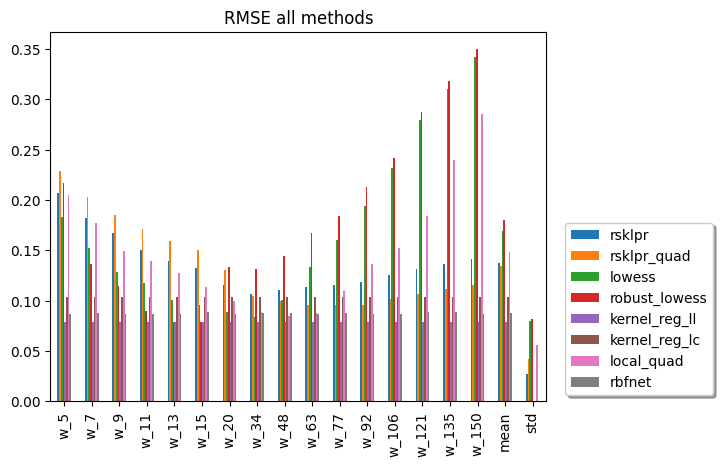

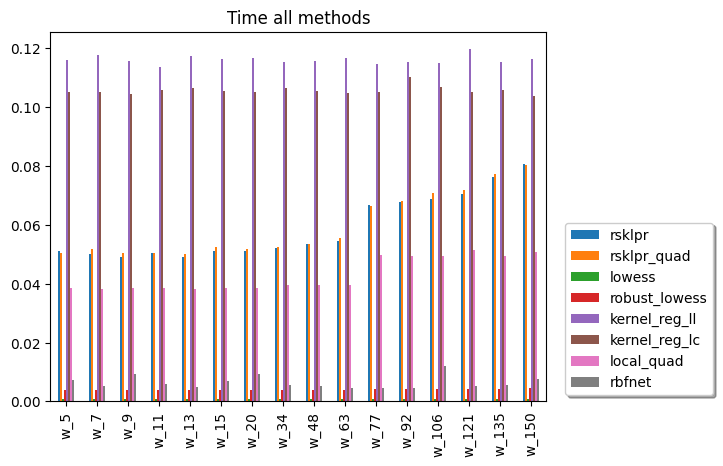

In [30]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="scott",
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [31]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.078802
w_7,kernel_reg_ll,0.078802
w_9,kernel_reg_ll,0.078802
w_11,kernel_reg_ll,0.078802
w_13,kernel_reg_ll,0.078802
w_15,robust_lowess,0.078583
w_20,kernel_reg_ll,0.078802
w_34,kernel_reg_ll,0.078802
w_48,kernel_reg_ll,0.078802
w_63,kernel_reg_ll,0.078802


In [32]:
worst_for_window

,method,rmse
w_5,rsklpr_quad,0.229053
w_7,rsklpr_quad,0.203089
w_9,rsklpr_quad,0.185080
w_11,rsklpr_quad,0.171425
w_13,rsklpr_quad,0.159827
w_15,rsklpr_quad,0.150884
w_20,robust_lowess,0.133816
w_34,robust_lowess,0.131467
w_48,robust_lowess,0.144429
w_63,robust_lowess,0.167190


### Medium noise

Best performing method is kernel_reg_ll for size_neighborhood w_5


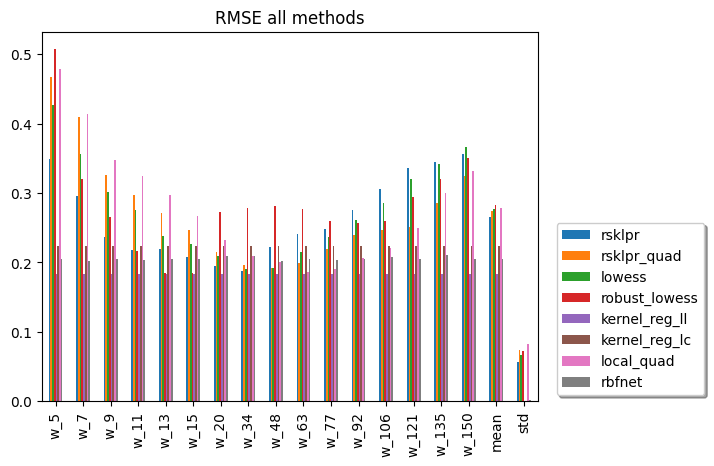

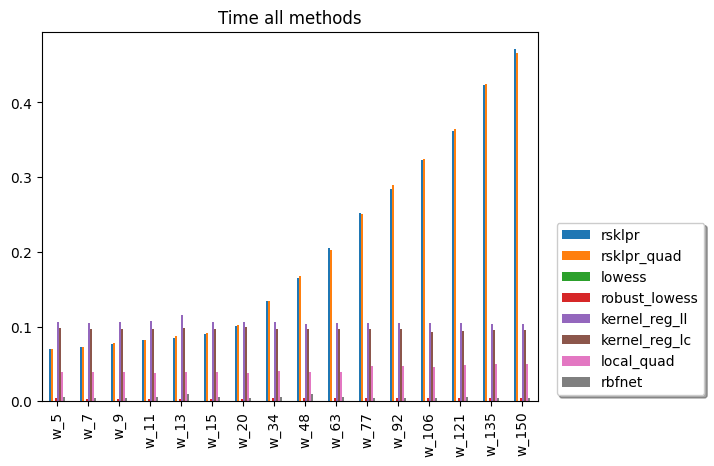

In [33]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="normal_reference",
    bw2="scott",
    kr="conden",
    methods=methods,
)

In [34]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.183225
w_7,kernel_reg_ll,0.183225
w_9,kernel_reg_ll,0.183225
w_11,kernel_reg_ll,0.183225
w_13,kernel_reg_ll,0.183225
w_15,kernel_reg_ll,0.183225
w_20,kernel_reg_ll,0.183225
w_34,kernel_reg_ll,0.183225
w_48,kernel_reg_ll,0.183225
w_63,kernel_reg_ll,0.183225


In [35]:
worst_for_window

,method,rmse
w_5,robust_lowess,0.506755
w_7,local_quad,0.413716
w_9,local_quad,0.348108
w_11,local_quad,0.324874
w_13,local_quad,0.297067
w_15,local_quad,0.266535
w_20,robust_lowess,0.272929
w_34,robust_lowess,0.278315
w_48,robust_lowess,0.281395
w_63,robust_lowess,0.276717


### High noise

Best performing method is rsklpr for size_neighborhood w_135


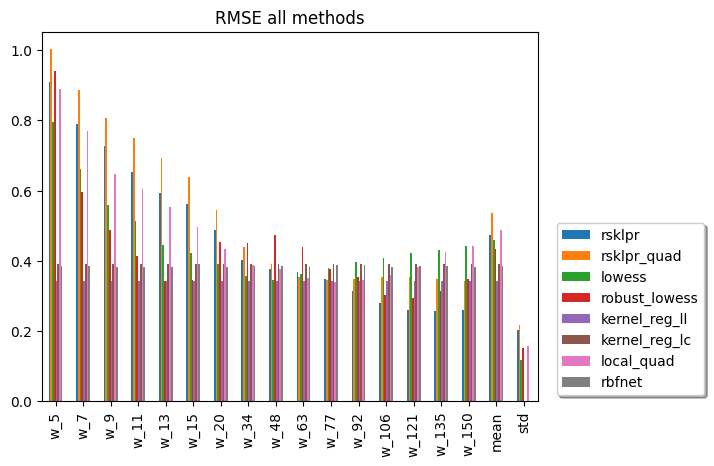

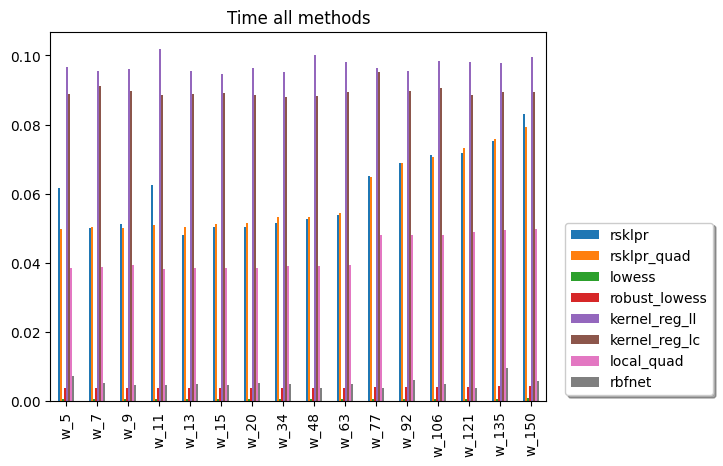

In [36]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="scott",
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [37]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.343574
w_7,kernel_reg_ll,0.343574
w_9,kernel_reg_ll,0.343574
w_11,kernel_reg_ll,0.343574
w_13,robust_lowess,0.342378
w_15,kernel_reg_ll,0.343574
w_20,kernel_reg_ll,0.343574
w_34,kernel_reg_ll,0.343574
w_48,kernel_reg_ll,0.343574
w_63,kernel_reg_ll,0.343574


In [38]:
worst_for_window

,method,rmse
w_5,rsklpr_quad,1.001414
w_7,rsklpr_quad,0.885618
w_9,rsklpr_quad,0.805184
w_11,rsklpr_quad,0.748025
w_13,rsklpr_quad,0.691119
w_15,rsklpr_quad,0.637545
w_20,rsklpr_quad,0.545792
w_34,robust_lowess,0.450495
w_48,robust_lowess,0.472281
w_63,robust_lowess,0.440015


### Extreme noise

Best performing method is rsklpr for size_neighborhood w_150


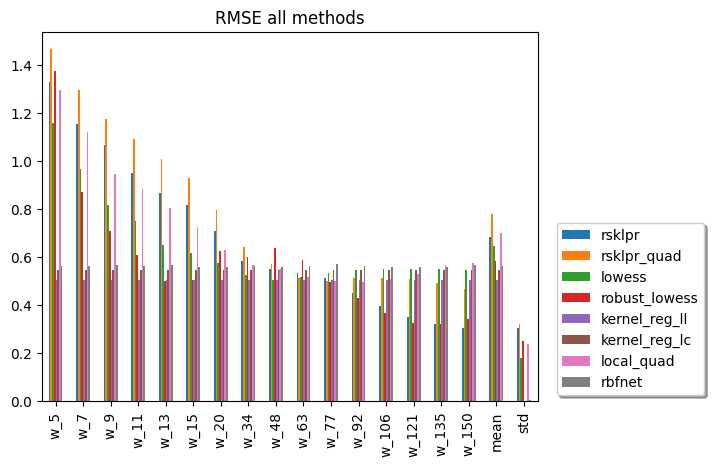

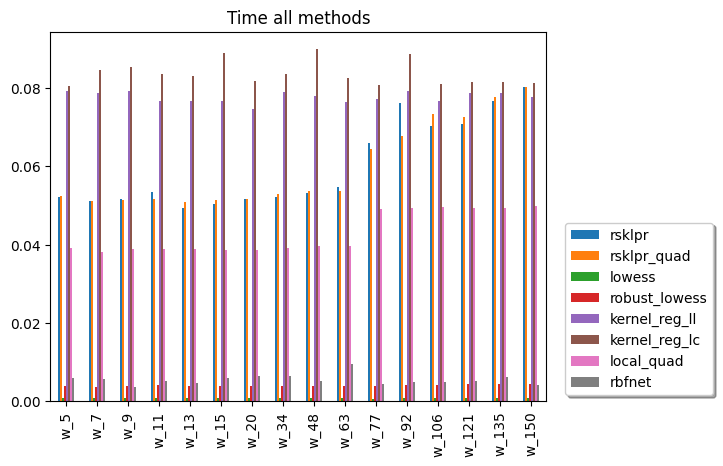

In [39]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_3,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1="scott",
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [40]:
best_for_window

,method,rmse
w_5,kernel_reg_ll,0.505924
w_7,kernel_reg_ll,0.505924
w_9,kernel_reg_ll,0.505924
w_11,kernel_reg_ll,0.505924
w_13,robust_lowess,0.500814
w_15,kernel_reg_ll,0.505924
w_20,kernel_reg_ll,0.505924
w_34,kernel_reg_ll,0.505924
w_48,lowess,0.504631
w_63,kernel_reg_ll,0.505924


In [41]:
worst_for_window

,method,rmse
w_5,rsklpr_quad,1.464872
w_7,rsklpr_quad,1.294876
w_9,rsklpr_quad,1.176964
w_11,rsklpr_quad,1.093377
w_13,rsklpr_quad,1.010565
w_15,rsklpr_quad,0.930696
w_20,rsklpr_quad,0.795830
w_34,rsklpr_quad,0.641891
w_48,robust_lowess,0.639999
w_63,robust_lowess,0.588714


## Curve 4

### Mild noise

Best performing method is rbfnet for size_neighborhood w_92


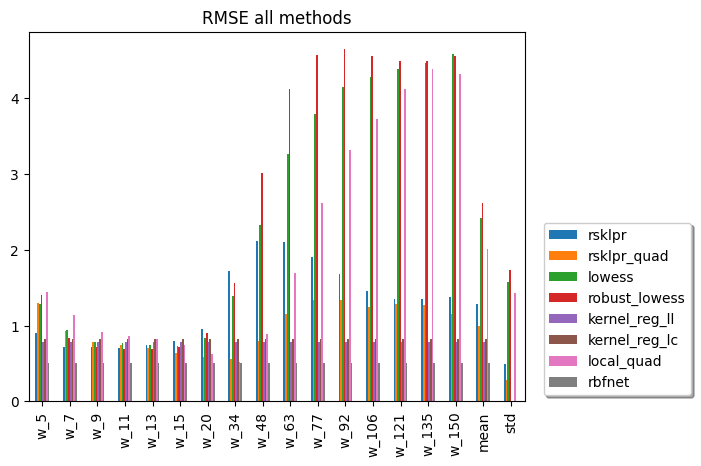

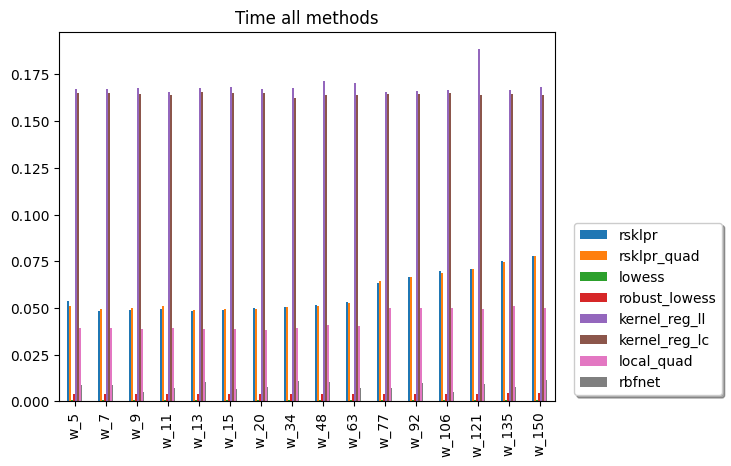

In [42]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [43]:
best_for_window

,method,rmse
w_5,rbfnet,0.504426
w_7,rbfnet,0.504421
w_9,rbfnet,0.504605
w_11,rbfnet,0.504794
w_13,rbfnet,0.504009
w_15,rbfnet,0.504327
w_20,rbfnet,0.503740
w_34,rbfnet,0.504834
w_48,rbfnet,0.505089
w_63,rbfnet,0.504279


In [44]:
worst_for_window

,method,rmse
w_5,local_quad,1.439687
w_7,local_quad,1.139669
w_9,local_quad,0.920442
w_11,local_quad,0.866248
w_13,kernel_reg_lc,0.829549
w_15,kernel_reg_lc,0.829549
w_20,rsklpr,0.961796
w_34,rsklpr,1.718162
w_48,robust_lowess,3.009399
w_63,robust_lowess,4.125525


### Medium noise

Best performing method is local_quad for size_neighborhood w_34


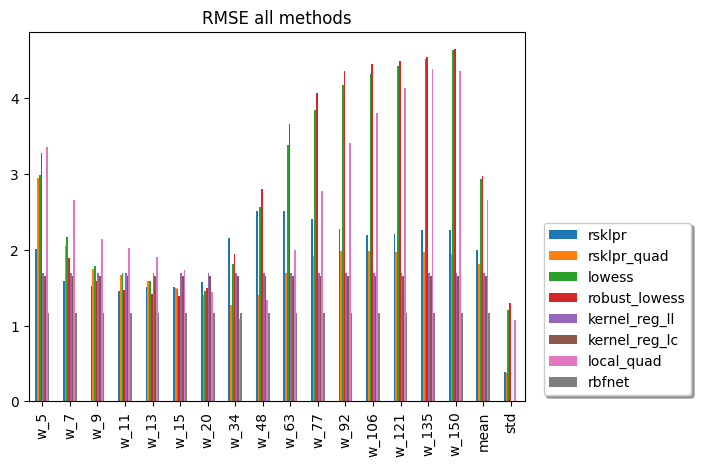

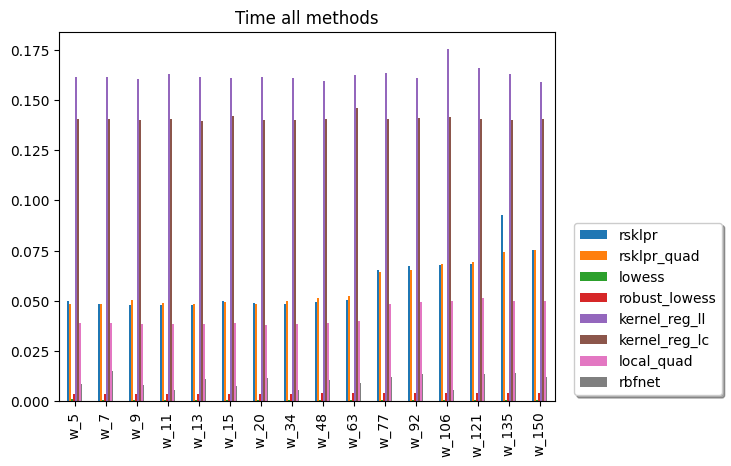

In [45]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [46]:
best_for_window

,method,rmse
w_5,rbfnet,1.167496
w_7,rbfnet,1.169142
w_9,rbfnet,1.168242
w_11,rbfnet,1.168422
w_13,rbfnet,1.167580
w_15,rbfnet,1.167564
w_20,rbfnet,1.169114
w_34,local_quad,1.088769
w_48,rbfnet,1.169240
w_63,rbfnet,1.166193


In [47]:
worst_for_window

,method,rmse
w_5,local_quad,3.358835
w_7,local_quad,2.658714
w_9,local_quad,2.146908
w_11,local_quad,2.020803
w_13,local_quad,1.911921
w_15,local_quad,1.732735
w_20,kernel_reg_ll,1.692250
w_34,rsklpr,2.155744
w_48,robust_lowess,2.798546
w_63,robust_lowess,3.664971


### High noise

Best performing method is local_quad for size_neighborhood w_34


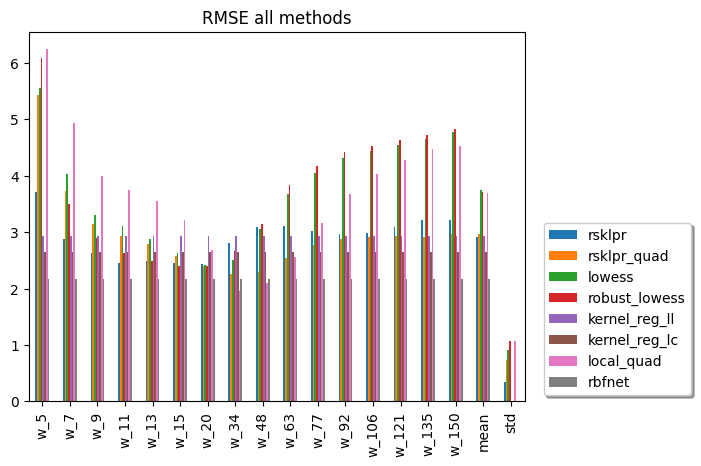

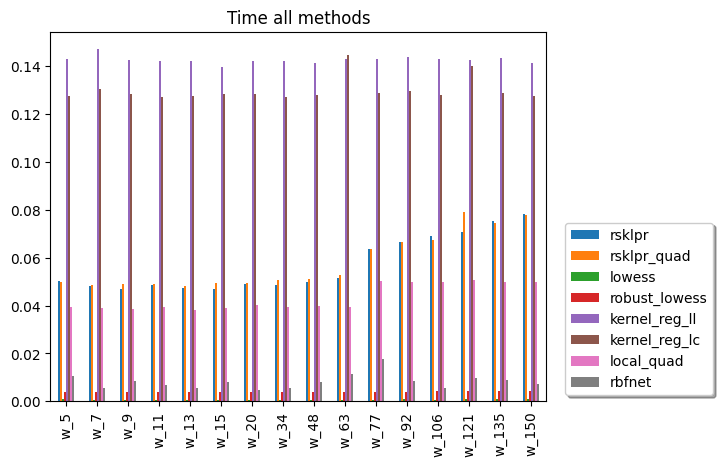

In [48]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [49]:
best_for_window

,method,rmse
w_5,rbfnet,2.165646
w_7,rbfnet,2.167741
w_9,rbfnet,2.166783
w_11,rbfnet,2.166049
w_13,rbfnet,2.167656
w_15,rbfnet,2.166452
w_20,rbfnet,2.168066
w_34,local_quad,1.956174
w_48,local_quad,2.100088
w_63,rbfnet,2.164171


In [50]:
worst_for_window

,method,rmse
w_5,local_quad,6.237558
w_7,local_quad,4.937282
w_9,local_quad,3.986611
w_11,local_quad,3.752646
w_13,local_quad,3.550529
w_15,local_quad,3.217185
w_20,kernel_reg_ll,2.922552
w_34,kernel_reg_ll,2.922552
w_48,robust_lowess,3.135245
w_63,robust_lowess,3.830819


### Extreme noise

Best performing method is local_quad for size_neighborhood w_34


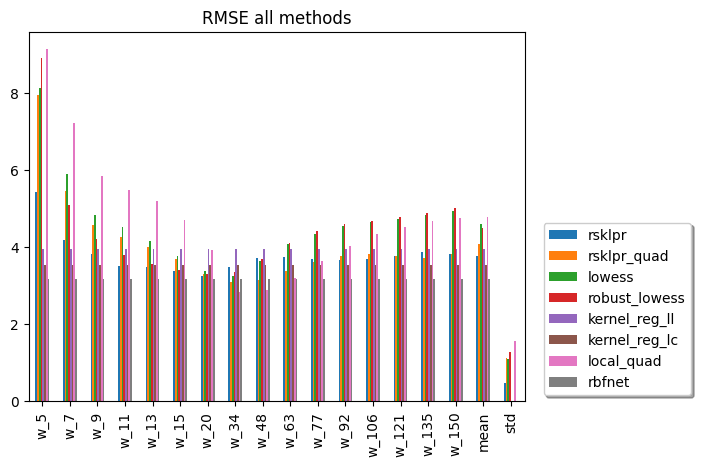

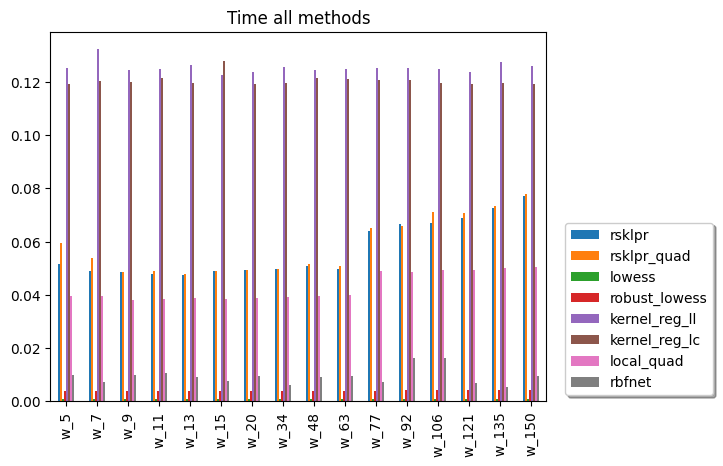

In [51]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_4,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [52]:
best_for_window

,method,rmse
w_5,rbfnet,3.166978
w_7,rbfnet,3.162495
w_9,rbfnet,3.166571
w_11,rbfnet,3.166092
w_13,rbfnet,3.165509
w_15,rbfnet,3.163633
w_20,rbfnet,3.164330
w_34,local_quad,2.824623
w_48,local_quad,2.878590
w_63,rbfnet,3.165075


In [53]:
worst_for_window

,method,rmse
w_5,local_quad,9.116280
w_7,local_quad,7.215850
w_9,local_quad,5.826313
w_11,local_quad,5.484491
w_13,local_quad,5.189141
w_15,local_quad,4.701644
w_20,kernel_reg_ll,3.948086
w_34,kernel_reg_ll,3.948086
w_48,kernel_reg_ll,3.948086
w_63,robust_lowess,4.105177


## Curve 5

### Mild noise

Best performing method is rsklpr_quad for size_neighborhood w_48


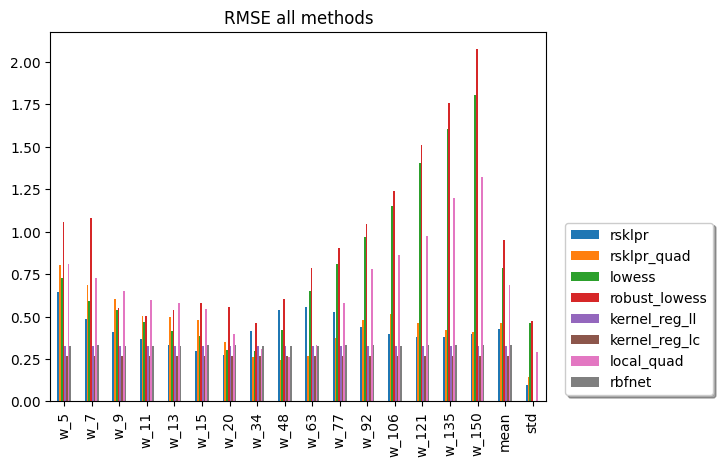

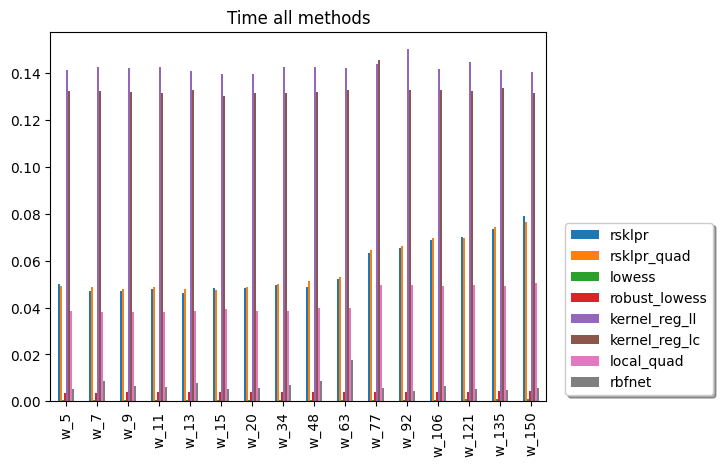

In [54]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=mild_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [55]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.266346
w_7,kernel_reg_lc,0.266346
w_9,kernel_reg_lc,0.266346
w_11,kernel_reg_lc,0.266346
w_13,kernel_reg_lc,0.266346
w_15,kernel_reg_lc,0.266346
w_20,kernel_reg_lc,0.266346
w_34,rsklpr_quad,0.264383
w_48,rsklpr_quad,0.241148
w_63,kernel_reg_lc,0.266346


In [56]:
worst_for_window

,method,rmse
w_5,robust_lowess,1.056440
w_7,robust_lowess,1.081853
w_9,local_quad,0.648271
w_11,local_quad,0.596582
w_13,local_quad,0.582565
w_15,robust_lowess,0.582020
w_20,robust_lowess,0.555297
w_34,robust_lowess,0.464065
w_48,robust_lowess,0.605934
w_63,robust_lowess,0.787506


### Medium noise

Best performing method is local_quad for size_neighborhood w_63


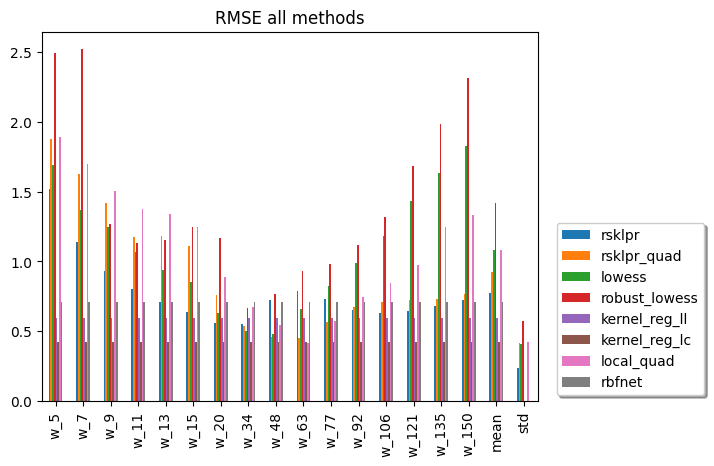

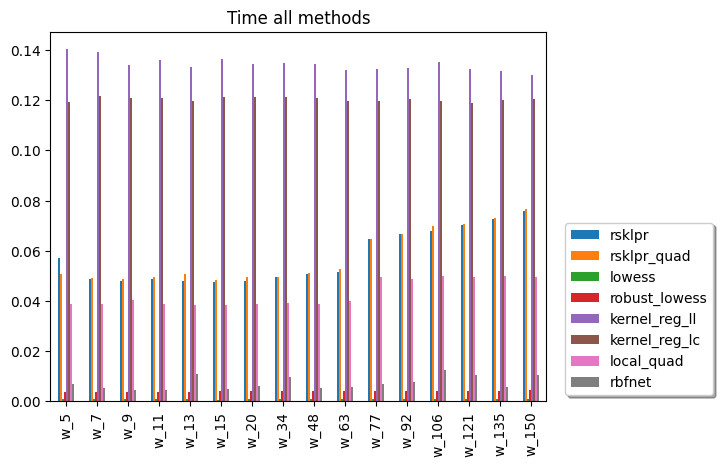

In [57]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=medium_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [58]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.422533
w_7,kernel_reg_lc,0.422533
w_9,kernel_reg_lc,0.422533
w_11,kernel_reg_lc,0.422533
w_13,kernel_reg_lc,0.422533
w_15,kernel_reg_lc,0.422533
w_20,kernel_reg_lc,0.422533
w_34,kernel_reg_lc,0.422533
w_48,kernel_reg_lc,0.422533
w_63,local_quad,0.419523


In [59]:
worst_for_window

,method,rmse
w_5,robust_lowess,2.488644
w_7,robust_lowess,2.515760
w_9,local_quad,1.502291
w_11,local_quad,1.376913
w_13,local_quad,1.339196
w_15,robust_lowess,1.248457
w_20,robust_lowess,1.165254
w_34,rbfnet,0.713644
w_48,robust_lowess,0.766322
w_63,robust_lowess,0.930869


### High noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


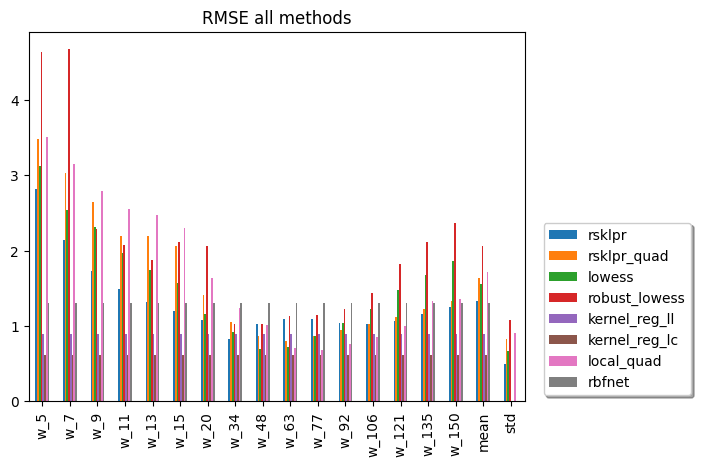

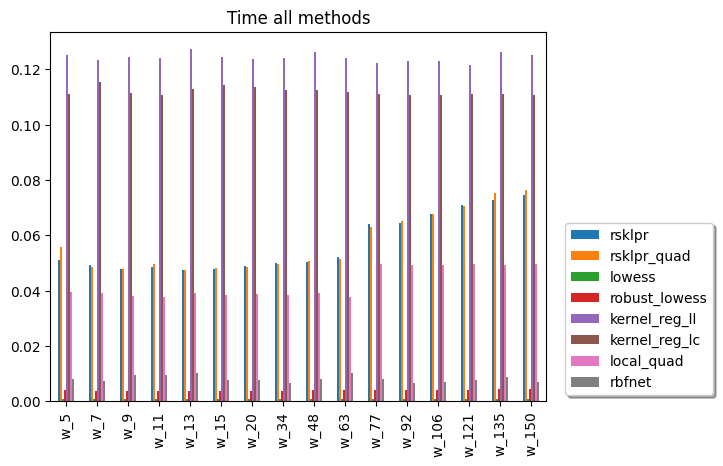

In [60]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=high_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [61]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.617097
w_7,kernel_reg_lc,0.617097
w_9,kernel_reg_lc,0.617097
w_11,kernel_reg_lc,0.617097
w_13,kernel_reg_lc,0.617097
w_15,kernel_reg_lc,0.617097
w_20,kernel_reg_lc,0.617097
w_34,kernel_reg_lc,0.617097
w_48,kernel_reg_lc,0.617097
w_63,kernel_reg_lc,0.617097


In [62]:
worst_for_window

,method,rmse
w_5,robust_lowess,4.643732
w_7,robust_lowess,4.672660
w_9,local_quad,2.786787
w_11,local_quad,2.552285
w_13,local_quad,2.480633
w_15,local_quad,2.301806
w_20,robust_lowess,2.061433
w_34,rbfnet,1.304381
w_48,rbfnet,1.304144
w_63,rbfnet,1.304912


### Extreme noise

Best performing method is kernel_reg_lc for size_neighborhood w_5


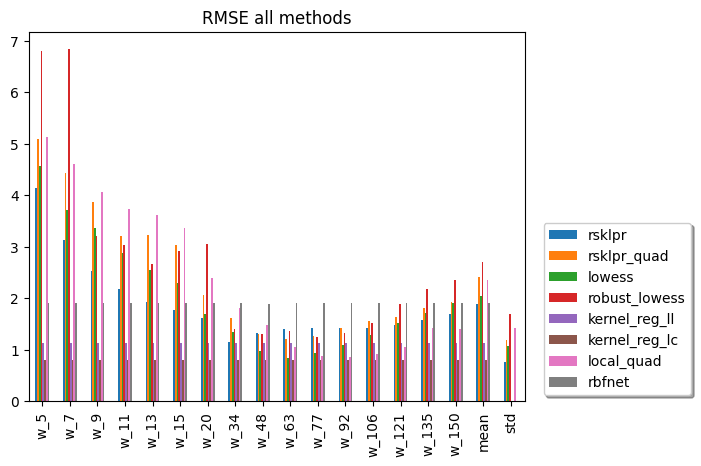

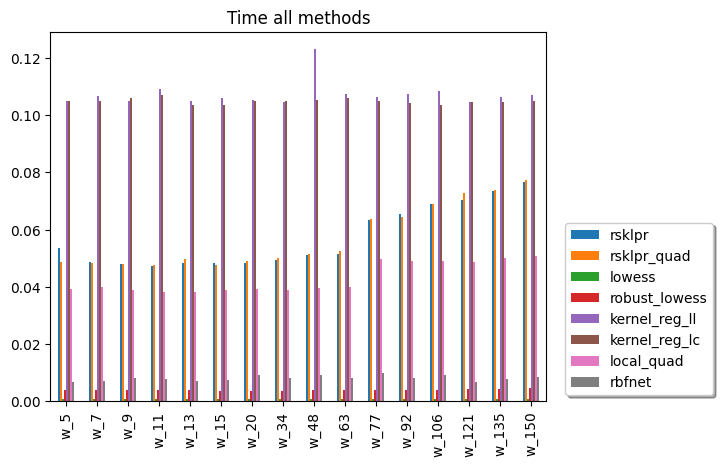

In [63]:
best_for_window, worst_for_window = run_increasing_size_neighborhoods_experiments(
    data_provider=benchmark_curve_5,
    noise_ratio=extreme_noise_ratio,
    hetero=hetero,
    num_points=num_points,
    size_neighborhoods=size_neighborhoods,
    bw1=bw1_f,
    bw2="scott",
    kr="joint",
    methods=methods,
)

In [64]:
best_for_window

,method,rmse
w_5,kernel_reg_lc,0.799503
w_7,kernel_reg_lc,0.799503
w_9,kernel_reg_lc,0.799503
w_11,kernel_reg_lc,0.799503
w_13,kernel_reg_lc,0.799503
w_15,kernel_reg_lc,0.799503
w_20,kernel_reg_lc,0.799503
w_34,kernel_reg_lc,0.799503
w_48,kernel_reg_lc,0.799503
w_63,kernel_reg_lc,0.799503


In [65]:
worst_for_window

,method,rmse
w_5,robust_lowess,6.805425
w_7,robust_lowess,6.829569
w_9,local_quad,4.071945
w_11,local_quad,3.728590
w_13,local_quad,3.623318
w_15,local_quad,3.360857
w_20,robust_lowess,3.055970
w_34,rbfnet,1.900193
w_48,rbfnet,1.899354
w_63,rbfnet,1.901097
